![Redfin](Redfin.png)

# Predicting Housing Market Trends Using Data Science

**Potential Insights:** This dataset provides insights into housing market trends across different regions. I chose this dataset because housing market data reflects economic patterns, consumer behavior, and financial stability. By analyzing price fluctuations, sales trends, and inventory changes, I aim to identify key indicators that predict market shifts. The structured approach from Kaggle competitions will be applied to extract meaningful patterns, focusing on how market dynamics evolve over time.     

Additionally, the dataset's inclusion of multiple region types allows for comparisons between national trends and city-specific behaviors, providing an opportunity to explore how different real estate markets respond to economic factors. By leveraging machine learning techniques learned from the competitions, I will analyze potential leading indicators of price changes and market cycles.

### Project Scope
**Objectives:** Identify key trends and patterns in the housing market, predict market fluctuations, and provide actionable insights into real estate trend      

**Deliverables:** Charts, graphs, statistical reports, predictive models, and a final research paper detailing insights and methodologies.      

Milestones:      
- Data collection and cleaning (Week 1)    
- Exploratory Data Analysis (Weeks 2-3)    
- Model selection and training (Weeks 4-6)     
- Model validation and optimization (Weeks 7-8)    
- Final report and presentation (Weeks 9-10)     

Tasks:       
- Data acquisition and preprocessing      
- Exploratory data analysis (EDA)      
- Feature engineering and selection      
- Model training and validation      
- Performance evaluation and optimization     
- Presentation of findings      

**Resources:** Python, Pandas, NumPy, Scikit-Learn, Matplotlib, Seaborn, Jupyter Notebook      

### Research Plan
**Techniques and Methods:** Time-series analysis, regression models, machine learning techniques, and cross-validation methods.
Application: Apply time-series forecasting models to predict housing price trends, use feature engineering techniques to identify key drivers of price fluctuations, and validate results using robust evaluation metrics.      

**Hypothesis**
- **Hypothesis Statement:** Housing market trends can be predicted by analyzing historical price fluctuations, inventory changes, and sales patterns. By applying machine learning techniques, we can identify early indicators of market shifts, allowing for better-informed real estate investment decisions.

# Imports

In [1]:
# my imports
import wrangle as w
import explore as e
#import modeling as m

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

imports loaded successfully, awaiting commands...


# Wrangle
---
- Raw Data acquired from Redfin
- 1099 rows x 20 columns before cleaning
- Data acquired from Google BigQuery after cleaning
- 1099 rows x 20 columns after cleaning

## Prepare
---
- Clean the data
    - Rename columns
    - Remove nulls
    - Remove extra characters
    - Remove extra spaces
    - Fixed data type

In [2]:
redfin_df = w.check_file_exists_gbq("data.csv", "service-account-key.json", 
                                    "iu-thesis-project.Redfin_Monthly_Housing_Market_Data.Redfin")

✅ CSV file 'data.csv' found locally. Checking data quality...
Detected encoding: ascii
✅ Data appears to be clean.
✅ Data is already clean. No need to clean or upload.


### A Brief Look At The Data
---

In [3]:
redfin_df.head()

,region,month_of_period_end,median_sale_price,median_sale_price_mom,median_sale_price_yoy,homes_sold,homes_sold_mom,homes_sold_yoy,new_listings,new_listings_mom,new_listings_yoy,inventory,inventory_mom,inventory_yoy,days_on_market,days_on_market_mom,days_on_market_yoy,average_sale_to_list,average_sale_to_list_mom,average_sale_to_list_yoy
0,National,2022-07-01 00:00:00+00:00,413000,-3.6,7.4,530476,-14.4,-21.9,705215,-14.3,-11.9,1240506,10.2,27.1,21,3,6,101.0,-1.2,-1.2
1,National,2022-08-01 00:00:00+00:00,407000,-1.5,6.9,559150,5.4,-16.9,622537,-11.7,-13.7,1225537,-1.2,26.7,27,5,10,99.9,-1.1,-1.7
2,National,2022-06-01 00:00:00+00:00,429000,-0.7,10.8,619857,4.1,-15.0,822855,6.4,1.0,1125321,20.7,28.1,18,1,3,102.2,-0.8,-0.3
3,National,2021-08-01 00:00:00+00:00,381000,-1.1,16.2,672612,-1.0,0.1,721768,-9.8,0.0,967307,-0.9,-18.2,17,2,-15,101.6,-0.6,2.4
4,National,2021-09-01 00:00:00+00:00,377000,-1.0,13.9,638337,-5.1,-4.7,675008,-6.5,-4.5,969546,0.2,-16.1,19,2,-11,101.0,-0.6,1.7


### A Summary Of The Data
---

In [4]:
e.data_summary(redfin_df)

data shape: (1099, 20)


,data type,#missing,%missing,#unique,count,mean,std,min,25%,50%,75%,max
region,object,0,0.0,7,1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month_of_period_end,"datetime64[ns, UTC]",0,0.0,157,1099,2018-07-01 19:52:21.401273856+00:00,NaN,2012-01-01 00:00:00+00:00,2015-04-01 00:00:00+00:00,2018-07-01 00:00:00+00:00,2021-10-01 00:00:00+00:00,2025-01-01 00:00:00+00:00
median_sale_price,int64,0,0.0,416,1099.0,407515.013649,189404.64317,134000.0,256500.0,371000.0,525000.0,925000.0
median_sale_price_mom,float64,0,0.0,186,1099.0,0.610464,3.657105,-12.8,-1.8,0.2,2.8,16.4
median_sale_price_yoy,float64,0,0.0,251,1099.0,6.849045,5.72749,-10.7,3.35,6.5,9.7,31.8
homes_sold,int64,0,0.0,1036,1099.0,73960.789809,174049.251215,974.0,3283.0,5108.0,7373.0,729414.0
homes_sold_mom,float64,0,0.0,556,1099.0,1.37152,18.047561,-40.6,-10.7,0.2,11.55,63.4
homes_sold_yoy,float64,0,0.0,490,1099.0,1.94222,17.349035,-56.9,-6.5,1.8,10.7,127.6
new_listings,int64,0,0.0,1062,1099.0,89187.496815,210707.155307,1010.0,3613.0,6070.0,9152.0,844234.0
new_listings_mom,float64,0,0.0,634,1099.0,3.776797,29.206833,-59.5,-13.0,-2.5,14.05,150.3


In [5]:
redfin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1099 entries, 0 to 1098
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   region                    1099 non-null   object             
 1   month_of_period_end       1099 non-null   datetime64[ns, UTC]
 2   median_sale_price         1099 non-null   int64              
 3   median_sale_price_mom     1099 non-null   float64            
 4   median_sale_price_yoy     1099 non-null   float64            
 5   homes_sold                1099 non-null   int64              
 6   homes_sold_mom            1099 non-null   float64            
 7   homes_sold_yoy            1099 non-null   float64            
 8   new_listings              1099 non-null   int64              
 9   new_listings_mom          1099 non-null   float64            
 10  new_listings_yoy          1099 non-null   float64            
 11  inventory        

---
# Exploration

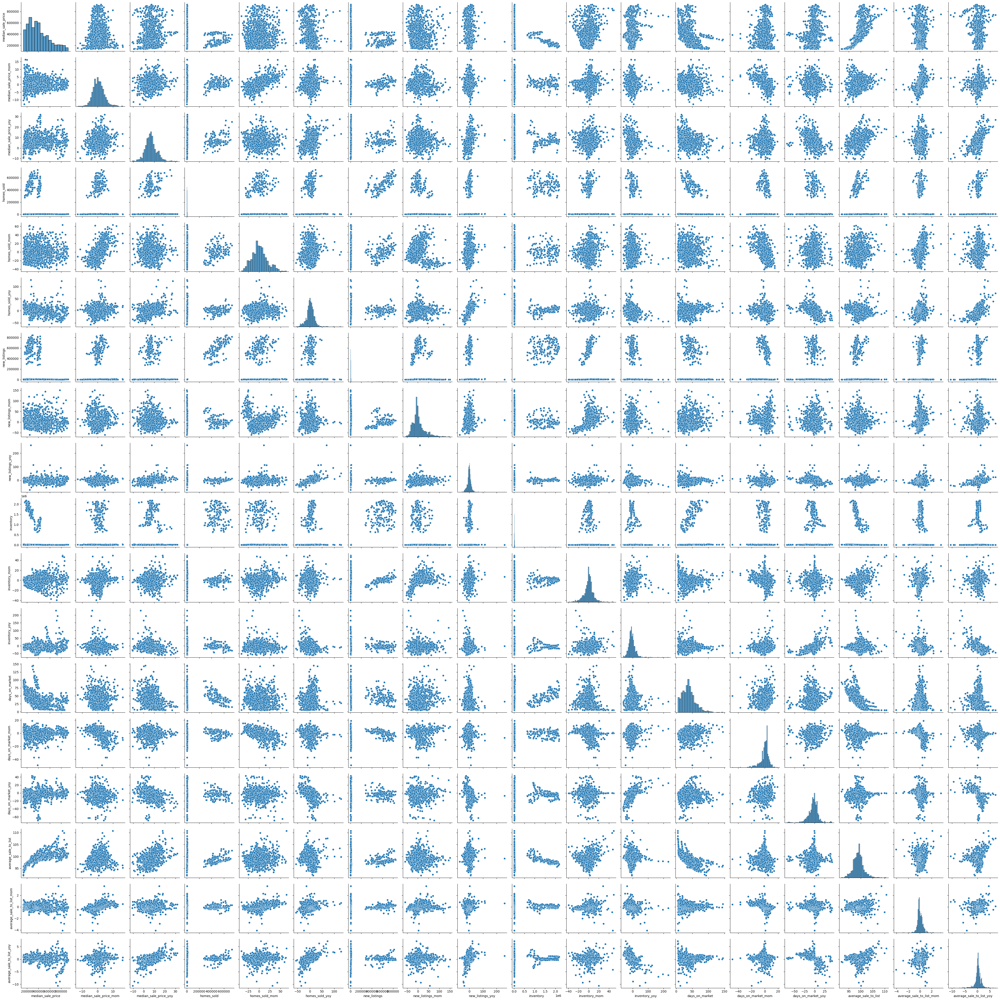

In [6]:
# visualized your data
import matplotlib.pyplot as plt
import seaborn as sns

# to view a bit closer the pairplot double click on the plot
sns.pairplot(redfin_df)

---
### What is the distribution of the Target?

- Note: this question is more of a look at the data, not a stats test question.

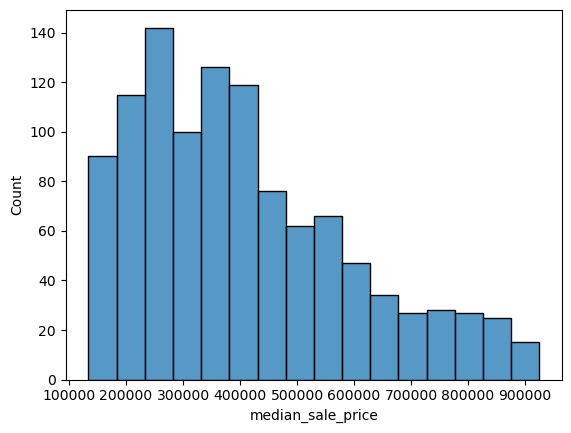

In [7]:
# get a histplot of quality
sns.histplot(redfin_df.median_sale_price)
plt.show()

#### Target Justification: **median_sale_price**

1. Core Predictive Goal
    - Both the Project Proposal (focused on housing market trend prediction) and Literature Review (highlighting house-price forecasting as critical) point to home prices as the principal outcome of interest.
    - As emphasized in Assignment 2, “Accurately predicting real estate house prices is critical for financial institutions, investors, and policymakers.”
2. Data Alignment
    - The Redfin dataset explicitly provides median_sale_price (along with month-over-month and year-over-year variations).
    - In real estate forecasting literature, the median sale price is a standard measure, serving as a robust, central indicator of market conditions.
3. Common Industry Metric
    - Forecasting median sale price is standard practice in both industry and academic settings. It allows analysis of market health and trend over time, region by region.

<div class="alert alert-block alert-info">
<b>Histogram Insights</b>
    
Looking at the histogram of median_sale_price:
- The distribution peaks roughly in the \\$200,000 - \\$300,000 range, indicating that many observations cluster around these mid-range house prices.
- The tail extends toward higher price points (up to $900,000), reflecting that while most houses fall in the lower-to-mid range, there are notable but fewer properties in higher price brackets.
- The shape suggests a right-skew (common in housing data), where a larger number of transactions occur at relatively moderate price levels, and fewer yet higher-priced properties cause the tail to stretch to the right.
</div>
---

In [8]:
import pandas as pd
# standard imports
import pandas as pd
import numpy as np

# visualized your data
import matplotlib.pyplot as plt
import seaborn as sns

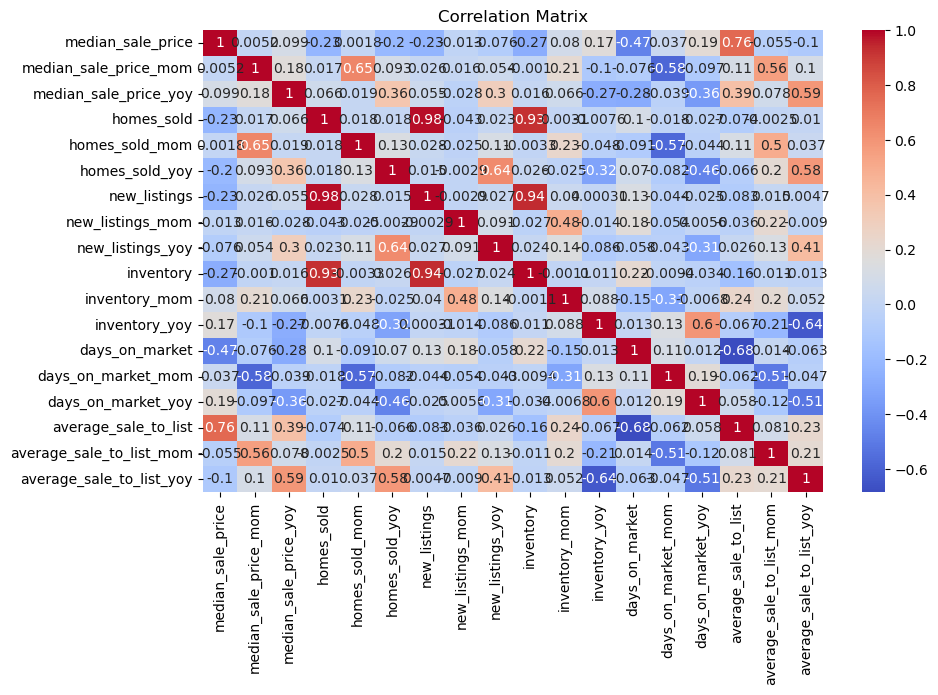

In [9]:
corr = redfin_df.corr()
plt.figure(figsize=(10,6))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

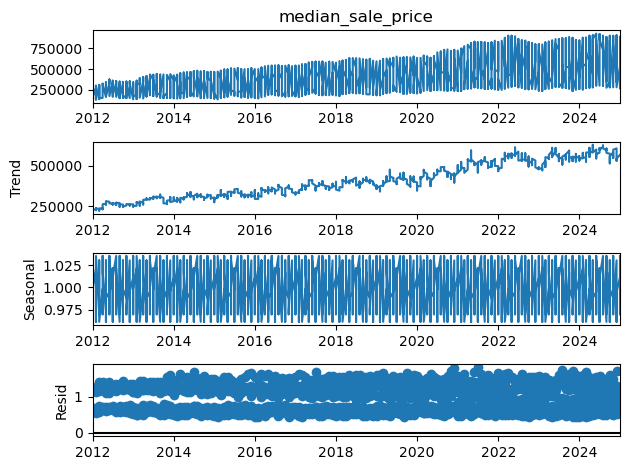

In [10]:
from statsmodels.tsa.seasonal import seasonal_decompose
df_ts = redfin_df.set_index('month_of_period_end').sort_index()
decomposition = seasonal_decompose(df_ts['median_sale_price'], model='multiplicative', period=12)
decomposition.plot()
plt.show()

In [11]:
# Identifying numerical and categorical columns
numerical_cols = redfin_df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = redfin_df.select_dtypes(include=['object', 'bool']).columns

In [12]:
def bivariate_boxplot(df, numerical_cols, categorical_cols):
    # Bivariate exploration: Plot each variable against your target
    
    # Now 'price_bin' is categorical
    df['price_bin'] = pd.qcut(df['median_sale_price'], q=4, labels=['Low','Medium','High','Very High'])

    # For a categorical target variable, your target can be on the x-axis, and numeric variables on the y
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x='price_bin', y=col, data=df)
        plt.title(f'{col} vs Median Sale Price')
        plt.show()

    # For a numeric target variable, your target can be on the y-axis, and independent variables on the x-axis
    for col in categorical_cols:
        if df[col].nunique() < 10:
            plt.figure(figsize=(8, 6))
            sns.boxplot(x=col, y='median_sale_price', data=df)
            plt.title(f'Median Sale Price vs {col}')
            plt.xticks(rotation=45)
            plt.show()
            
    for col in numerical_cols:
        if col != 'median_sale_price':
            plt.figure(figsize=(8,6))
            sns.scatterplot(x=col, y='median_sale_price', hue='region', data=df)
            plt.title(f'{col} vs. Median Sale Price')
            plt.show()

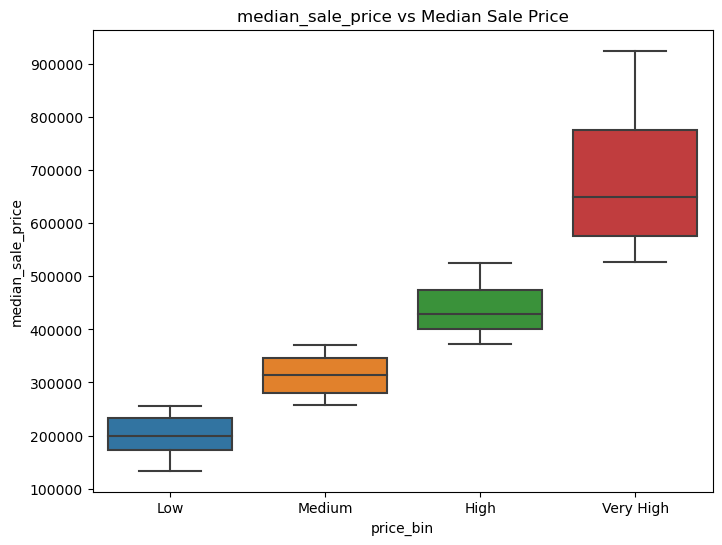

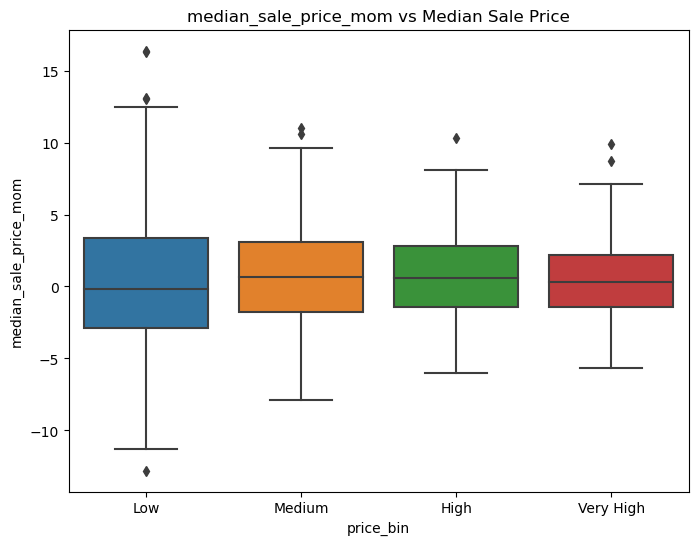

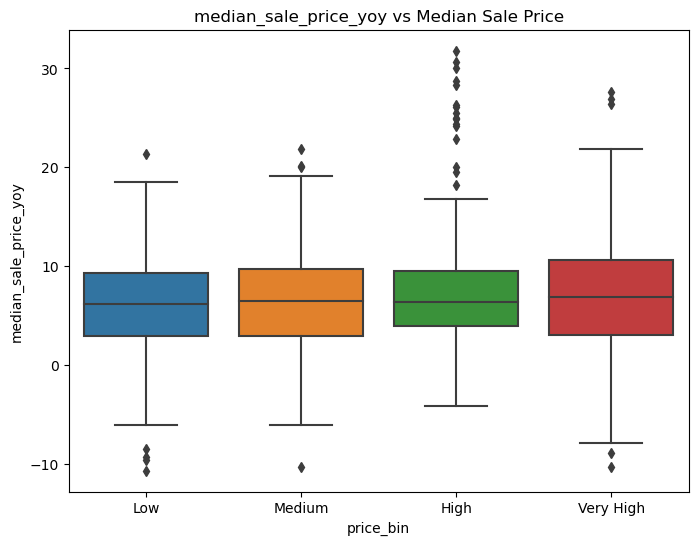

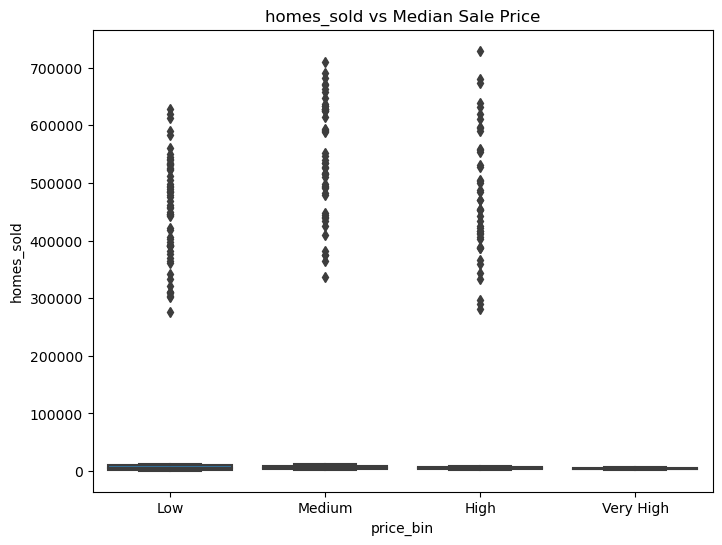

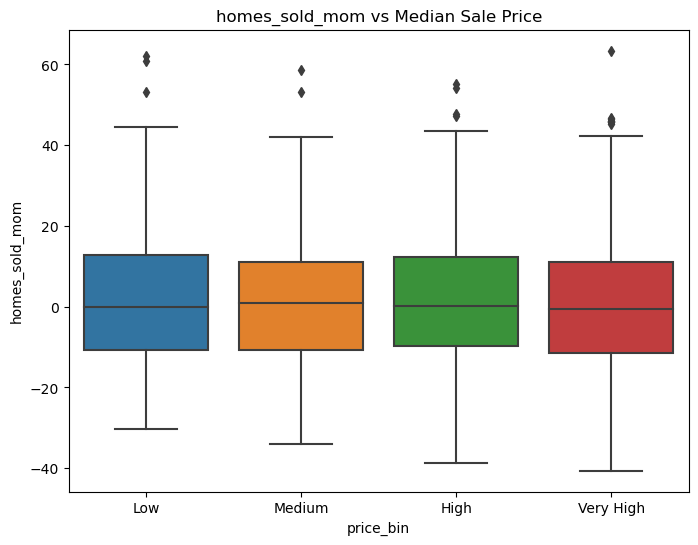

...

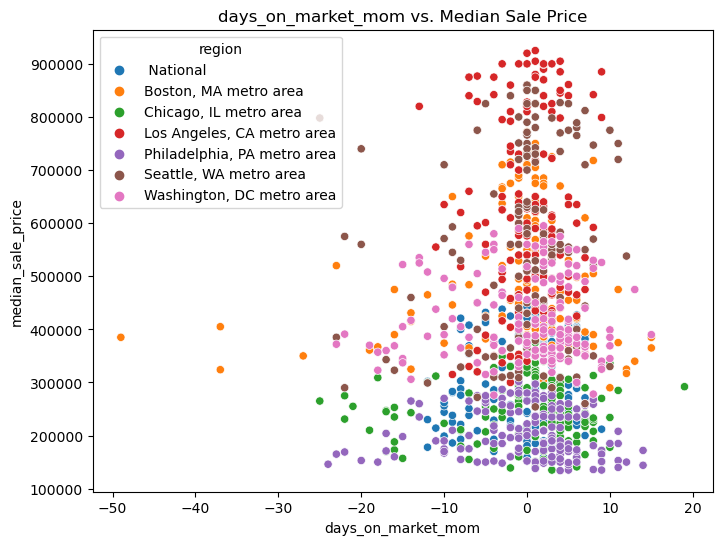

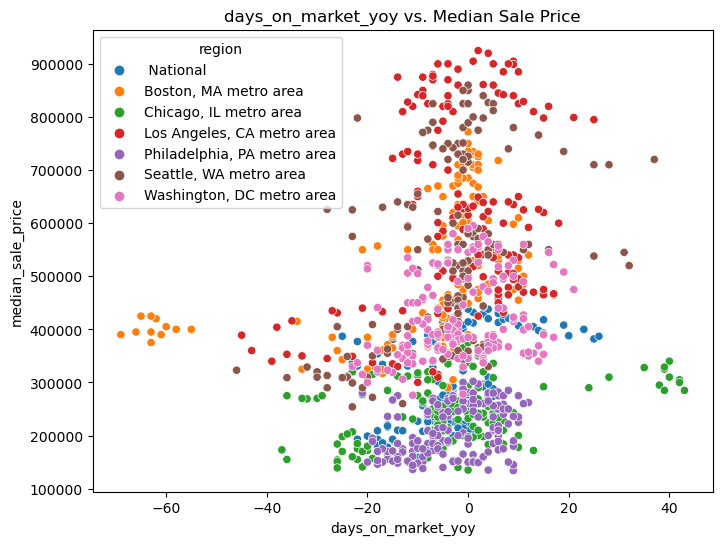

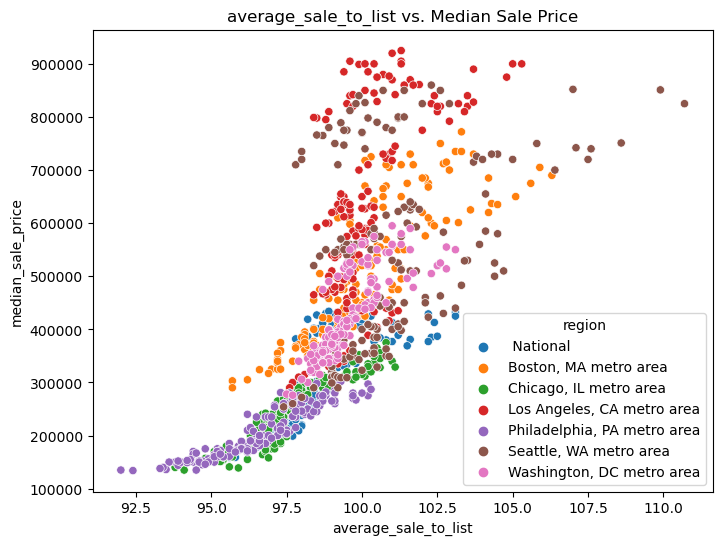

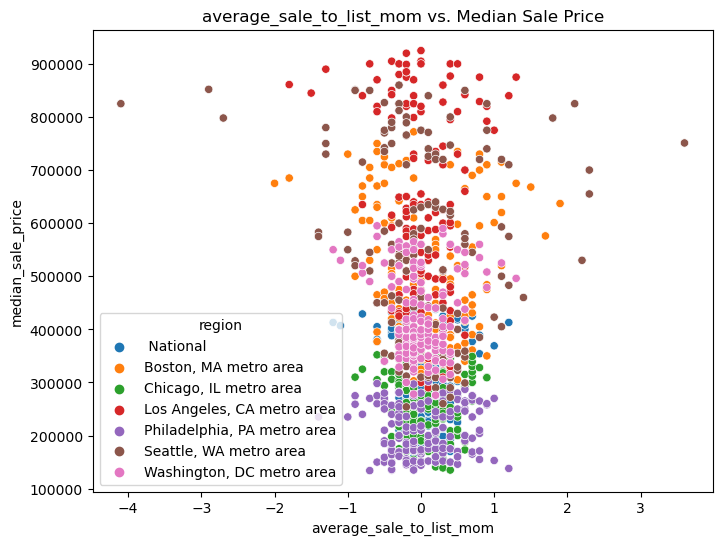

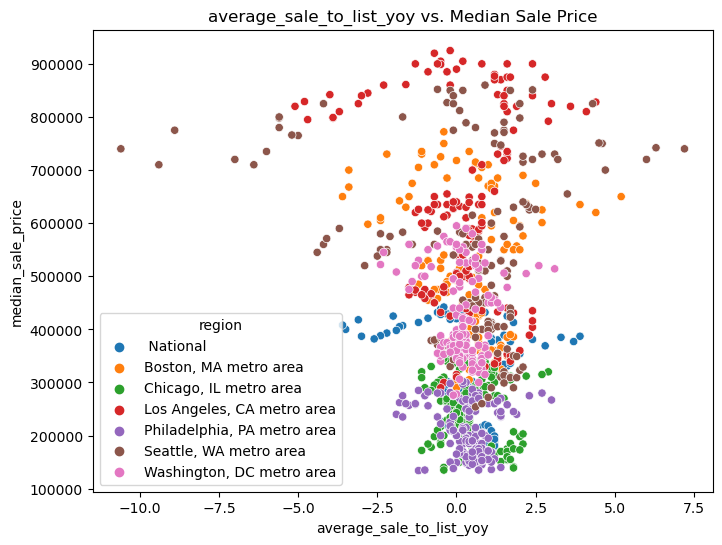

In [13]:
bivariate_boxplot(redfin_df, numerical_cols, categorical_cols)

In [14]:
redfin_df.groupby('region')['price_bin'].describe()

,count,unique,top,freq
region,,,,
National,157,3,Low,61
"Boston, MA metro area",157,3,High,71
"Chicago, IL metro area",157,3,Low,94
"Los Angeles, CA metro area",157,3,Very High,106
"Philadelphia, PA metro area",157,2,Low,119
"Seattle, WA metro area",157,4,Very High,85
"Washington, DC metro area",157,3,High,83


In [15]:
redfin_df['month_of_period_end'] = redfin_df['month_of_period_end'].dt.tz_localize(None)

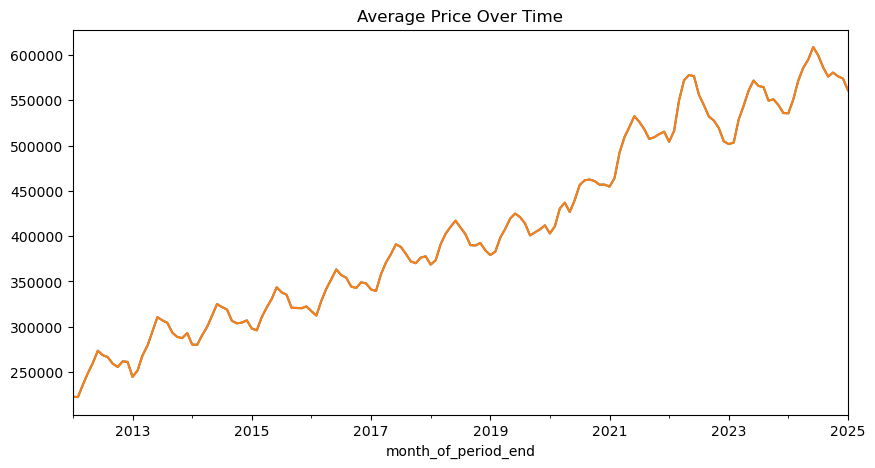

In [19]:
redfin_df.groupby('month_of_period_end')['median_sale_price'].mean().plot(figsize=(10,5))
plt.title('Average Price Over Time')
plt.show()

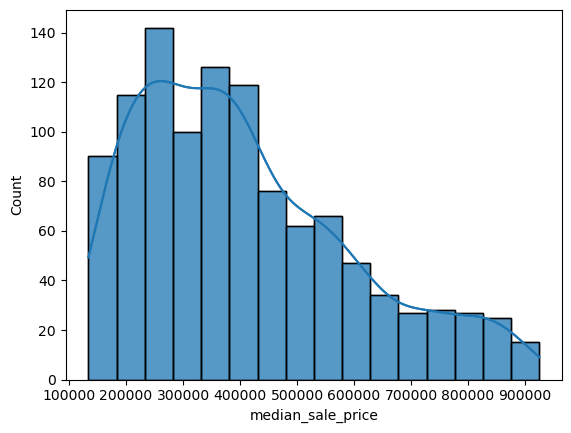

In [21]:
sns.histplot(redfin_df['median_sale_price'], kde=True)
plt.show()